In [1]:
import warnings
warnings.filterwarnings("ignore")

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.cluster import KMeans
import torch
from transformers import AutoTokenizer, AutoModel
from pprint import pprint

import os, sys, json
rpath = os.path.abspath('..')
if rpath not in sys.path:
    sys.path.insert(0, rpath)

import utils.llm_model as utils

In [62]:
data = pd.read_csv("../data_files/week_clean_without_comment_labeled/all_week7_finetune.csv")
data = pd.DataFrame(data)

In [51]:
data = data.drop('Unnamed: 0', axis=1)

In [66]:
rows_to_drop = [1, 3, 5, 7, 8, 9, 11, 12, 14, 19]
data = data.drop(rows_to_drop)
# Reset the index
data = data.reset_index(drop=True)
data.shape

(11, 4)

In [65]:
data.loc[10:]

,user_id,code_content,Email,label
10,705,import json\nimport re\n \nclass Util:\n def ...,redogirma@gmail.com,Intermediate
11,682,! pip install transformers bitsandbytes peft t...,mikikinfe345@gmail.com,Basic
12,585,"import sys, os\n\nimport pandas as pd\n\nsys.p...",co.rodolphe@gmail.com,Basic
13,763,"import sys, os\n\nimport pandas as pd\n\nsys.p...",mekmeskassa@gmail.com,Basic
14,696,! pip install transformers bitsandbytes peft t...,naolatechshd@gmail.com,Basic
15,605,"import sys, os\n\nimport pandas as pd\n\nsys.p...",abdimussa87@gmail.com,Advanced
16,730,"import sys, os\n\nimport pandas as pd\n\nsys.p...",dbekele213@gmail.com,Intermediate
17,645,! pip install transformers bitsandbytes peft t...,elias.assamnew@gmail.com,Intermediate
18,777,"import sys, os\n\nimport pandas as pd\n\nsys.p...",eyaya@aims.ac.za,Intermediate
19,625,"import sys, os\n\nimport pandas as pd\n\nsys.p...",alextakele16@gmail.com,Intermediate


In [59]:
data.shape

(17, 5)

In [67]:
import re
from pprint import pprint

def remove_extra_spaces(strings):
    updated_strings = []
    pattern = r"\n+"

    for string in strings:
        updated_string = re.sub(pattern, "\n", string.strip())
        updated_strings.append(updated_string)

    return updated_strings

data['code_content'] = remove_extra_spaces(data['code_content'])
# pprint(value)

In [68]:
data.to_csv('../data_files/reduced/reduced_week7.csv', index=True)

In [69]:
data.columns

Index(['user_id', 'code_content', 'Email', 'label'], dtype='object')

In [38]:
#pprint(data['code_content'][0])

In [ ]:
# Load pre-trained CodeBERT tokenizer and model
tokenizer = AutoTokenizer.from_pretrained("microsoft/codebert-base")
model = AutoModel.from_pretrained("microsoft/codebert-base")
# Example Python code snippets from the dataset
code_snippets = data['code_content']
#code_snippets = [snippet.splitlines() for snippet in code_snippets]

# Flatten the list of strings
# code_snippets = [line for snippet in code_snippets for line in snippet]

# Tokenize and encode the code snippets from the dataset
encoded_inputs = tokenizer(code_snippets, padding=True, truncation=True, return_tensors="pt")

# Generate code embeddings
with torch.no_grad():
    outputs = model(**encoded_inputs)
    embeddings = outputs.last_hidden_state.mean(dim=1)

In [7]:
embeddings

tensor([[-0.3859, -0.0041,  0.2529,  ..., -0.9088, -0.3485,  0.5696],
        [-0.3987,  0.0653,  0.2683,  ..., -0.8872, -0.3341,  0.4854],
        [-0.3302,  0.0496,  0.2635,  ..., -0.9333, -0.3616,  0.5398],
        ...,
        [-0.1919,  0.0909,  0.2829,  ..., -0.7695, -0.3461,  0.4602],
        [-0.1145,  0.1333,  0.2490,  ..., -0.3907, -0.3303,  0.4511],
        [-0.5000,  0.2367,  0.2959,  ..., -0.6804, -0.4306,  0.4938]])

In [12]:
# from langchain.embeddings.openai import OpenAIEmbeddings

# embed_model = OpenAIEmbeddings(model="text-embedding-ada-002")

# embeddings_2d = embed_model.embed_documents("./txt/python.txt")
# len(embeddings_2d), len(embeddings_2d[0])

(16, 1536)

In [10]:
#embeddings_2d

In [4]:
from langchain.embeddings.openai import OpenAIEmbeddings

embed_model = OpenAIEmbeddings(model="text-embedding-ada-002")

embedded_documents = []
for code_content in data['code_content']:
    embedded_document = embed_model.embed_documents([code_content])
    embedded_documents.append(embedded_document)


In [6]:

# Reshape job_embeddings to have two dimensions
# embeddings_2d = np.reshape(embedded_documents, (len(embedded_documents), -1))

In [13]:
optimal_k = utils.silhouette_to_find_optimal_k(embeddings)

In [14]:
optimal_k

2

In [15]:
cluster_labels, job_embeddings = utils.kmeans_clustering(optimal_k, embeddings)

In [16]:
# data['text_embedding_cluster'] = cluster_labels
cluster_labels

array([1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1], dtype=int32)

In [12]:
def Fetch_Each_clustering_Content(texts, cluster_labels):
    # Write text data for each cluster to separate text files
    for cluster_label in range(optimal_k):
        cluster_texts = np.array(texts)[np.array(cluster_labels) == cluster_label]
        save_path = f'./txt/week1_python{cluster_label}_texts.txt'

        with open(save_path, 'w') as file:
            for text in cluster_texts:
                file.write(text + '\n')
    
    return cluster_labels

# Specify the optimal number of clusters and the path for saving the text file
texts = data['code_content'].tolist()
# Perform k-means clustering and save the cluster labels
cluster_labels = Fetch_Each_clustering_Content(texts, cluster_labels)

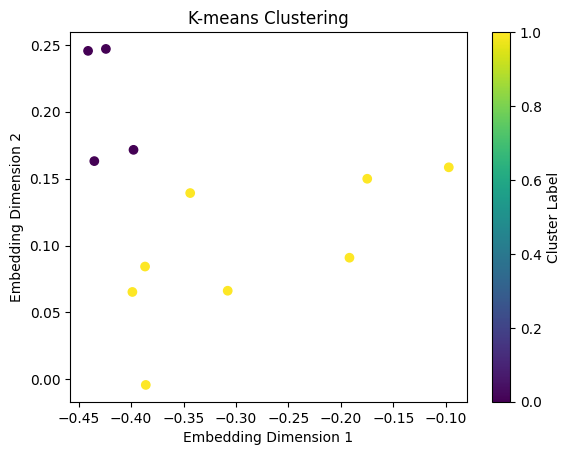

In [17]:
# Extract the x and y coordinates for the scatter plot
x = [embedding[0] for embedding in job_embeddings]  # X-axis values
y = [embedding[1] for embedding in job_embeddings]  # Y-axis values

# Create the scatter plot with cluster colors
plt.scatter(x, y, c=cluster_labels, cmap='viridis')
plt.xlabel('Embedding Dimension 1')
plt.ylabel('Embedding Dimension 2')
plt.title('K-means Clustering')
plt.colorbar(label='Cluster Label')
plt.show()

In [64]:
def perform_nested_clustering(cluster_label, job_embeddings, cluster_labels, k):
    # Filter the job embeddings for the specified cluster
    cluster_indices = np.where(cluster_labels == cluster_label)[0]
    cluster_embeddings = job_embeddings[np.array(cluster_indices), :]
    opt_k = utils.silhouette_to_find_optimal_k(cluster_embeddings)
    
    # Perform K-means clustering on the embeddings within the cluster
    # nested_k = 3  # Number of clusters for nested clustering
    nested_kmeans = KMeans(n_clusters=opt_k, random_state=42)
    nested_cluster_labels = nested_kmeans.fit_predict(cluster_embeddings)
    
    return nested_cluster_labels, opt_k, cluster_embeddings

# Choose the cluster you want to perform nested clustering on (e.g., Cluster 0)
cluster_to_nest = 0

# Perform nested clustering within the specified cluster
nested_cluster_labels, opt_k, cluster_embeddings = perform_nested_clustering(cluster_to_nest, job_embeddings, cluster_labels, optimal_k)

In [65]:
opt_k

3

In [35]:
cluster_embeddings

tensor([[-0.3859, -0.0041,  0.2529,  ..., -0.9088, -0.3485,  0.5696],
        [-0.3987,  0.0653,  0.2683,  ..., -0.8872, -0.3341,  0.4854],
        [-0.3302,  0.0496,  0.2635,  ..., -0.9333, -0.3616,  0.5398],
        ...,
        [-0.3964,  0.0797,  0.2756,  ..., -1.0954, -0.3648,  0.6023],
        [-0.1919,  0.0909,  0.2829,  ..., -0.7695, -0.3461,  0.4602],
        [-0.5000,  0.2367,  0.2959,  ..., -0.6804, -0.4306,  0.4938]])

In [40]:
nested_cluster_labels

array([2, 2, 2, 1, 2, 0, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0,
       1, 2, 2, 2, 2, 2, 2, 2, 1, 1, 2, 2, 2, 2, 2, 1], dtype=int32)

In [66]:
def Fetch_Each_nested_clustering_Content(texts, nested_cluster_labels):
    # Write text data for each cluster to separate text files
    for cluster_label in range(opt_k):
        cluster_texts = np.array(texts)[np.array(nested_cluster_labels) == cluster_label]
        save_path = f'./txt/week1_pynested{cluster_label}_texts.txt'

        with open(save_path, 'w') as file:
            for text in cluster_texts:
                file.write(text + '\n')
    
    return nested_cluster_labels

# Specify the optimal number of clusters and the path for saving the text file
# texts = data['code_content'].tolist()
# Filter the texts and cluster_labels to match cluster_to_nest
filtered_texts = np.array(data['code_content'])[np.array(cluster_labels) == cluster_to_nest]
filtered_cluster_labels = np.array(cluster_labels)[np.array(cluster_labels) == cluster_to_nest]
# Perform k-means clustering and save the cluster labels
nested_cluster_labels = Fetch_Each_nested_clustering_Content(filtered_texts, nested_cluster_labels)

In [43]:
len(filtered_texts)

38

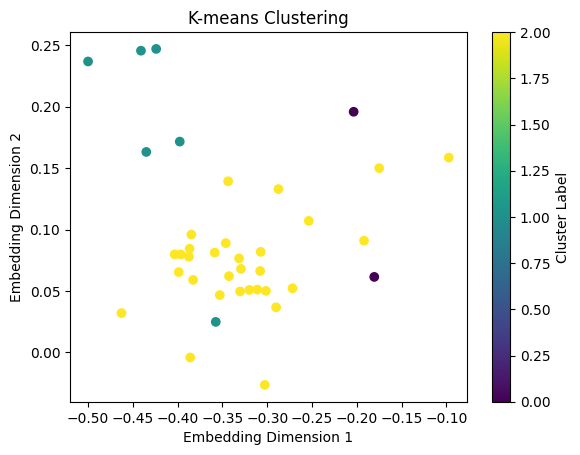

In [49]:
# Extract the x and y coordinates for the scatter plot
x = [embedding[0] for embedding in cluster_embeddings]  # X-axis values
y = [embedding[1] for embedding in cluster_embeddings]  # Y-axis values

# Create the scatter plot with cluster colors
plt.scatter(x, y, c=nested_cluster_labels, cmap='viridis')
plt.xlabel('Embedding Dimension 1')
plt.ylabel('Embedding Dimension 2')
plt.title('K-means Clustering')
plt.colorbar(label='Cluster Label')
plt.show()

In [38]:
import matplotlib.pyplot as plt
import numpy as np

def plot_clusters(job_embeddings, cluster_labels, k):
    # Define the cluster-color mapping
    cluster_colors = {
        0: 'red',
        1: 'blue',
        2: 'green',
        3: 'orange',
        4: 'purple',
        5: 'yellow',
        6: 'pink',
        7: 'cyan'
    }
    
    # Create a list of colors for each data point based on cluster labels
    colors = [cluster_colors[label] for label in cluster_labels]
    
    # Create a scatter plot of the job embeddings with cluster colors
    plt.scatter(job_embeddings[:, 0], job_embeddings[:, 1], c=colors)
    plt.xlabel('Dimension 1')
    plt.ylabel('Dimension 2')
    plt.title(f'KMeans Clustering Results (K={k})')
    plt.show()

# Assuming you have the cluster labels and job embeddings
cluster_labels, job_embeddings = utils.kmeans_clustering(optimal_k, embeddings_2d)

# Plot the clusters
#plot_clusters(job_embeddings, cluster_labels, optimal_k)

In [39]:
import matplotlib.pyplot as plt
import numpy as np

def plot_single_cluster(cluster_label, job_embeddings, cluster_labels, k):
    # Filter the job embeddings and cluster labels for the specified cluster
    cluster_indices = np.where(cluster_labels == cluster_label)[0]
    cluster_embeddings = job_embeddings[cluster_indices]
    
    # Create a scatter plot of the embeddings for the specific cluster
    plt.scatter(cluster_embeddings[:, 0], cluster_embeddings[:, 1])
    plt.xlabel('Dimension 1')
    plt.ylabel('Dimension 2')
    plt.title(f'Cluster {cluster_label} Visualization (K={k})')
    plt.show()

# Assuming you have the cluster labels and job embeddings
# cluster_labels, job_embeddings = utils.kmeans_clustering(optimal_k, embeddings_2d)

# Choose the cluster you want to visualize (e.g., cluster 0)
cluster_to_visualize = 8

# Plot the specified cluster
#plot_single_cluster(cluster_to_visualize, job_embeddings, cluster_labels, optimal_k)

In [19]:
# embeddings_2d

In [50]:
import matplotlib.pyplot as plt
import numpy as np

def save_single_cluster_with_text(cluster_label, job_embeddings, cluster_labels, k, texts, save_path):
    # Filter the job embeddings, cluster labels, and texts for the specified cluster
    cluster_indices = np.where(cluster_labels == cluster_label)[0]
    cluster_indices = np.unique(cluster_indices)  # Get unique indices
    cluster_embeddings = job_embeddings[cluster_indices]
    cluster_texts = texts.iloc[cluster_indices]  # Assuming texts is a column in a Pandas DataFrame

    # Add the texts as annotations to the plot
    # for i, text in enumerate(cluster_texts):
    #     plt.annotate(text, (cluster_embeddings[i, 0], cluster_embeddings[i, 1]))

    # Print the texts associated with the data points
    for text in cluster_texts:
        print(text)
        
    with open(save_path, 'w') as file:
        for text in cluster_texts:
            file.write(text + '\n')
    
    # Create a scatter plot of the embeddings for the specific cluster
    plt.scatter(cluster_embeddings[:, 0], cluster_embeddings[:, 1])
    plt.scatter(cluster_embeddings[:, 0], cluster_embeddings[:, 1])
    plt.xlabel('Dimension 1')
    plt.ylabel('Dimension 2')
    plt.title(f'Cluster {cluster_label} Visualization (K={k})')
    plt.show()
    


In [37]:
data.shape

(175, 3)

In [40]:
# Choose the cluster you want to perform nested clustering on (e.g., Cluster 0)
cluster_to_nest = 0

# Perform nested clustering within the specified cluster
nested_cluster_labels, opt_k, cluster_embeddings = perform_nested_clustering(cluster_to_nest, job_embeddings, cluster_labels, optimal_k)


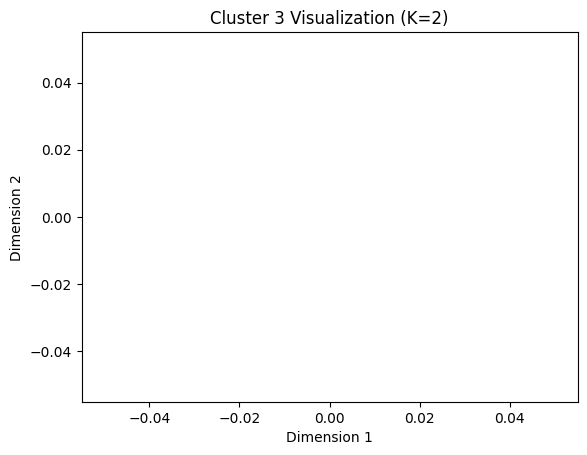

In [54]:

df = data
texts = df['code_content']  # Replace 'text_column' with the actual column name containing the text data

# Choose the cluster you want to visualize (e.g., cluster 0)
cluster_to_visualize = 3

# Specify the save path for the image file
save_path = './txt2/cluster0.txt'

# Plot the specified cluster
save_single_cluster_with_text(cluster_to_visualize, cluster_embeddings, nested_cluster_labels, opt_k, texts, save_path)

BY WORDS

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def plot_cluster_embeddings(cluster_label, job_embeddings, cluster_labels, k):
    # Filter the job embeddings for the specified cluster
    cluster_indices = np.where(cluster_labels == cluster_label)[0]
    cluster_embeddings = job_embeddings[cluster_indices]
    
    # Create a scatter plot of the embeddings for the specific cluster
    plt.scatter(cluster_embeddings[:, 0], cluster_embeddings[:, 1])
    
    plt.xlabel('Dimension 1')
    plt.ylabel('Dimension 2')
    plt.title(f'Cluster {cluster_label} Visualization (K={k})')
    plt.show()

# Choose the cluster you want to perform nested clustering on (e.g., Cluster 0)
cluster_to_nest = 7

# Perform nested clustering within the specified cluster
nested_cluster_labels, opt_k, cluster_embeddings = perform_nested_clustering(cluster_to_nest, job_embeddings, cluster_labels, optimal_k)

# Choose the cluster you want to visualize (e.g., cluster 0)
cluster_to_visualize = 7

# Filter the word counts for the specified cluster
cluster_words = result_df[result_df['Cluster'] == cluster_to_visualize]['Word']

# Plot the specified cluster's embeddings
plot_cluster_embeddings(cluster_to_visualize, cluster_embeddings, nested_cluster_labels, opt_k)

# Print the words associated with the cluster
print("Words in the cluster:")
for word in cluster_words:
    print(word)

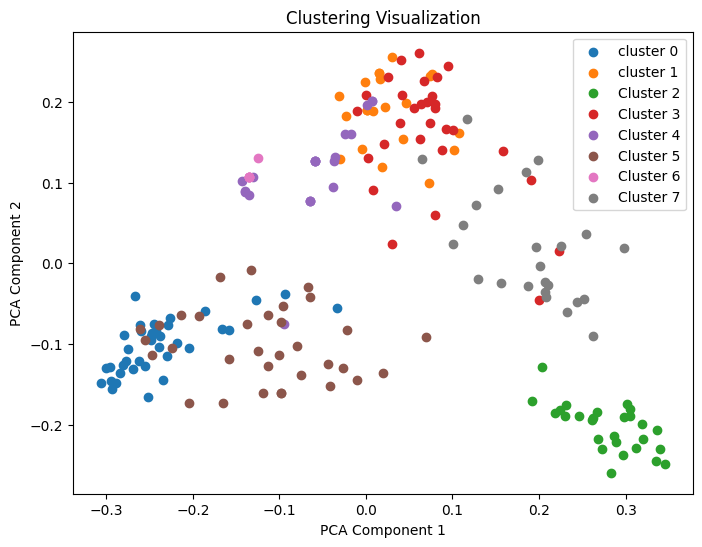

In [ ]:
from sklearn.decomposition import PCA
def visualize_clusters(job_embeddings, cluster_labels,jobs_df):
    pca = PCA(n_components=2, random_state=42)
    embeddings_2d = pca.fit_transform(job_embeddings)
        
    plt.figure(figsize=(8, 6))
    for label in np.unique(cluster_labels):
        if label == 0:
            plt.scatter(embeddings_2d[cluster_labels == label, 0], embeddings_2d[cluster_labels == label, 1], label=f'cluster 0')
        elif label == 1:
            plt.scatter(embeddings_2d[cluster_labels == label, 0], embeddings_2d[cluster_labels == label, 1], label=f'cluster 1')
        else:
            plt.scatter(embeddings_2d[cluster_labels == label, 0], embeddings_2d[cluster_labels == label, 1], label=f'Cluster {label}')
        
    plt.title('Clustering Visualization')
    plt.xlabel('PCA Component 1')
    plt.ylabel('PCA Component 2')
    plt.legend()
    plt.show()
visualize_clusters(job_embeddings, cluster_labels, result_df)

In [ ]:
from collections import Counter

# Assuming you have a list of embedded documents called 'embedded_documents'
word_frequencies = Counter()

# Iterate over the embedded documents
for embedded_document in embedded_documents:
    # Flatten the embedded document into a single list of words
    words = [word for sublist in embedded_document for word in sublist]
    
    # Update the word frequencies
    word_frequencies.update(words)

# Print the most common words and their frequencies
for word, frequency in word_frequencies.most_common():
    print(f"{word}: {frequency}")

-0.014675685789496197: 20
-0.015546969702451499: 16
0.01895042091582634: 12
-0.007950464075902669: 12
-0.013055642758610037: 8
-0.007160863204409904: 8
-0.008072988870927113: 8
0.010339687334331276: 8
-0.005489768330817317: 8
-0.013225814946749759: 8
0.02020289142428427: 8
-0.012470248792281704: 8
-0.030195427345798907: 8
0.030767207239052845: 8
-0.003614466319229662: 8
-0.019304381227825285: 8
0.03155680671356178: 8
-0.03340828712406754: 8
0.010891047049296176: 8
0.03294541609011855: 8
0.018283344373696747: 8
-0.0036485008034237336: 8
-0.004278139575921296: 8
0.024137282174334973: 8
0.015247465682750136: 8
-0.015968996654532202: 8
-0.03958895709055592: 8
0.016826668357058216: 8
-0.010203549397554988: 8
0.009121252008559334: 8
-0.005908393161613252: 8
0.014063064608341627: 8
-0.007684994773226014: 8
-0.010931888337196806: 8
0.00961134932601201: 8
-0.015737563000202813: 8
0.020461555087407556: 8
-0.023170701612504015: 8
0.02170041152279109: 8
-0.026982569430175376: 8
0.00457764312996138

In [ ]:
from sklearn.cluster import KMeans
import numpy as np

# Assuming you have the word frequencies stored in the 'word_frequencies' Counter object

# Convert the word frequencies into a list of tuples
word_frequency_tuples = list(word_frequencies.items())

# Extract the words and frequencies separately
words, frequencies = zip(*word_frequency_tuples)

# Convert the frequencies into a numpy array
X = np.array(frequencies).reshape(-1, 1)

# Specify the desired number of clusters (K) for k-means
#

# Apply k-means clustering
kmeans = KMeans(n_clusters=optimal_k)
kmeans.fit(X)

# Get the cluster labels
cluster_labels = kmeans.labels_

# Analyze the resulting clusters
for cluster in range(optimal_k):
    words_in_cluster = np.array(words)[cluster_labels == cluster]
    words_in_cluster = [str(word) for word in words_in_cluster]  # Convert array elements to strings
    print(f"Cluster {cluster}: {', '.join(words_in_cluster)}")

Cluster 0: 0.0023256547697358128, 0.013200403035899472, 0.00047694762618810606, -0.017988717565400263, -0.017591404211902684, 0.012618133690920522, -0.011802955490362997, -0.03299073230862874, 0.008782001420683926, 0.03605963737976002, 0.010124648087795734, 0.011604298813614208, 4.452652862722837e-05, 0.014933513179536399, 0.016043251922392126, -0.03400456625461256, 0.012885292862683893, -0.013844325930243043, 0.000688020490752834, -0.008138079457662855, 0.00846004043917339, 0.0073092010374991604, 0.03885453619612297, 0.013412760397915677, -0.0075969107715024055, -0.006083008798176641, 0.03257971733854125, -0.009864338793004824, -0.011275487023808714, -0.00819288126741002, -0.024784151287273806, 0.00273666904133143, 0.012364674273102071, 0.0021680994502973985, 0.02744204325096259, 0.012234520091367865, 0.029373809140025808, -0.019851982822093894, 0.018742243147915665, 0.020153392310042054, 0.01926286173749749, -0.023989524580278653, 0.0017074211259298965, 0.0041409671623322385, -0.0032